In [158]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from fbprophet import Prophet
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
import math
from datetime import datetime
from pprint import pprint

In [159]:
df1=pd.read_csv('AMF_CA-TP1_BASE_HH_3-5.csv',skiprows=2)
df2=pd.read_csv('AMF_CA-TP2_BASE_HH_2-5.csv',skiprows=2)
df3=pd.read_csv('AMF_CA-TP3_BASE_HH_3-5.csv',skiprows=2)
df4=pd.read_csv('AMF_CA-TP4_BASE_HH_4-5.csv',skiprows=2)
display(df1)

,TIMESTAMP_START,TIMESTAMP_END,NEE_PI,FC,LE,H,USTAR,SC,CO2,LE_PI_F,...,TS_PI_F_5,TS_PI_F_6,P_PI_F,W_SIGMA,V_SIGMA,GPP_PI_F,RECO_PI_F,NEE_PI_F,P_RAIN_PI_F_2_1_1,VPD_PI_F
0,200201010000,200201010030,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.3224
1,200201010030,200201010100,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.2985
2,200201010100,200201010130,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.3099
3,200201010130,200201010200,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.3154
4,200201010200,200201010230,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.3341
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280507,201712312130,201712312200,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0000
280508,201712312200,201712312230,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0000
280509,201712312230,201712312300,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0000
280510,201712312300,201712312330,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0000


In [160]:
col_list=df1.columns
print(df1.shape)
print(df2.shape)
print(df3.shape)
print(df4.shape)
print(col_list)
print(df2.columns)
print(df3.columns)
print(df4.columns)

(280512, 68)
(122736, 67)
(280512, 68)
(280512, 82)
Index(['TIMESTAMP_START', 'TIMESTAMP_END', 'NEE_PI', 'FC', 'LE', 'H', 'USTAR',
       'SC', 'CO2', 'LE_PI_F', 'H_PI_F', 'H2O', 'SH_PI_F', 'G_PI_F_1',
       'NETRAD', 'PPFD_IN', 'PPFD_OUT', 'TA', 'RH', 'WS', 'WD', 'PA',
       'P_RAIN_1_1_1', 'TS_1_1_1', 'TS_1_2_1', 'TS_1_3_1', 'TS_1_4_1',
       'TS_1_5_1', 'TS_1_6_1', 'TS_2_1_1', 'TS_2_2_1', 'TS_2_3_1', 'TS_2_4_1',
       'TS_2_5_1', 'TS_2_6_1', 'SWC_1_1_1', 'SWC_1_2_1', 'SWC_1_3_1',
       'SWC_1_4_1', 'SWC_1_5_1', 'SWC_2_1_1', 'SWC_2_2_1', 'SWC_2_3_1',
       'SWC_2_4_1', 'SWC_2_5_1', 'G_1_1_1', 'G_2_1_1', 'TA_PI_F', 'RH_PI_F',
       'PPFD_IN_PI_F', 'WS_PI_F', 'PA_PI_F', 'NETRAD_PI_F', 'SW_IN_PI_F',
       'TS_PI_F_1', 'TS_PI_F_2', 'TS_PI_F_3', 'TS_PI_F_4', 'TS_PI_F_5',
       'TS_PI_F_6', 'P_PI_F', 'W_SIGMA', 'V_SIGMA', 'GPP_PI_F', 'RECO_PI_F',
       'NEE_PI_F', 'P_RAIN_PI_F_2_1_1', 'VPD_PI_F'],
      dtype='object')
Index(['TIMESTAMP_START', 'TIMESTAMP_END', 'NEE_PI', 'FC', 'L

In [161]:
#首先是将数据转化为datatime的格式，踢出无关数据
df1=df1[['TIMESTAMP_START','PA','RH','SWC_1_1_1','TA','PPFD_OUT','PPFD_IN','CO2','H2O','GPP_PI_F','RECO_PI_F','NEE_PI_F']]
df2=df2[['TIMESTAMP_START','PA','RH','SWC_1_1_1','TA','PPFD_OUT','PPFD_IN','CO2_1_1_1','H2O','GPP_PI_F','RECO_PI_F','NEE_PI_F']]
df3=df3[['TIMESTAMP_START','PA','RH','SWC_1_1_1','TA','PPFD_OUT','PPFD_IN','CO2_1_1_1','H2O','GPP_PI_F','RECO_PI_F','NEE_PI_F']]
df4=df4[['TIMESTAMP_START','PA_PI_F','RH_1_1_1','SWC_1_1_1','TA_1_1_1','PPFD_OUT','PPFD_IN','CO2_1_1_1','H2O','GPP_PI_F','RECO_PI_F','NEE_PI_F']]

In [162]:
df1=df1[(df1['PA']!=-9999.0 )& (df1['RH']!=-9999.0 )& (df1['SWC_1_1_1']!=-9999.0 )& (df1['TA']!=-9999.0) & (df1['PPFD_OUT']!=-9999.0) & (df1['PPFD_IN']!=-9999.0) & (df1['CO2']!=-9999.0 )& (df1['H2O']!=-9999.0 )& (df1['GPP_PI_F']!=-9999.0)&(df1['NEE_PI_F']!=-9999.0)&(df1['RECO_PI_F']!=-9999.0) ]
df2=df2[(df2['PA']!=-9999.0 )& (df2['RH']!=-9999.0 )& (df2['SWC_1_1_1']!=-9999.0 )& (df2['TA']!=-9999.0) & (df2['PPFD_OUT']!=-9999.0) & (df2['PPFD_IN']!=-9999.0) & (df2['CO2_1_1_1']!=-9999.0 )& (df2['H2O']!=-9999.0 )& (df2['GPP_PI_F']!=-9999.0)&(df2['NEE_PI_F']!=-9999.0)&(df2['RECO_PI_F']!=-9999.0) ]
df3=df3[(df3['PA']!=-9999.0 )& (df3['RH']!=-9999.0 )& (df3['SWC_1_1_1']!=-9999.0 )& (df3['TA']!=-9999.0) & (df3['PPFD_OUT']!=-9999.0) & (df3['PPFD_IN']!=-9999.0) & (df3['CO2_1_1_1']!=-9999.0 )& (df3['H2O']!=-9999.0 )& (df3['GPP_PI_F']!=-9999.0)&(df3['NEE_PI_F']!=-9999.0)&(df3['RECO_PI_F']!=-9999.0) ]
df4=df4[(df4['PA_PI_F']!=-9999.0 )& (df4['RH_1_1_1']!=-9999.0 )& (df4['SWC_1_1_1']!=-9999.0 )& (df4['TA_1_1_1']!=-9999.0) & (df4['PPFD_OUT']!=-9999.0) & (df4['PPFD_IN']!=-9999.0) & (df4['CO2_1_1_1']!=-9999.0 )& (df4['H2O']!=-9999.0 )& (df4['GPP_PI_F']!=-9999.0)&(df4['NEE_PI_F']!=-9999.0)&(df4['RECO_PI_F']!=-9999.0) ]


In [163]:
a = datetime.strptime('201001251230', '%Y%m%d%H%M')
date=[datetime.strptime(str(i), '%Y%m%d%H%M') for i in df1['TIMESTAMP_START'].values.tolist()]
df1['TIMESTAMP_START']=date
date2=[datetime.strptime(str(i), '%Y%m%d%H%M') for i in df2['TIMESTAMP_START'].values.tolist()]
df2['TIMESTAMP_START']=date2
date3=[datetime.strptime(str(i), '%Y%m%d%H%M') for i in df3['TIMESTAMP_START'].values.tolist()]
df3['TIMESTAMP_START']=date3
date4=[datetime.strptime(str(i), '%Y%m%d%H%M') for i in df4['TIMESTAMP_START'].values.tolist()]
df4['TIMESTAMP_START']=date4

In [164]:
df1.index=df1['TIMESTAMP_START']
df2.index=df2['TIMESTAMP_START']
df3.index=df3['TIMESTAMP_START']
df4.index=df4['TIMESTAMP_START']


In [165]:
df1=df1.drop(['TIMESTAMP_START'],axis=1)
df2=df2.drop(['TIMESTAMP_START'],axis=1)
df3=df3.drop(['TIMESTAMP_START'],axis=1)
df4=df4.drop(['TIMESTAMP_START'],axis=1)



In [166]:
df1_1=df1['NEE_PI_F'].groupby(pd.Grouper(freq='D')).sum()
df1_1=df1_1*48*30*60*12*(10**(-6))
# df2_1=df2['NEE_PI_F'].groupby(pd.Grouper(freq='D')).sum()
# df2_1=df2_1*48*30*60*12*(10**(-6))/44
df3_1=df3['NEE_PI_F'].groupby(pd.Grouper(freq='D')).sum()
df3_1=df3_1*48*30*60*12*(10**(-6))
df4_1=df4['NEE_PI_F'].groupby(pd.Grouper(freq='D')).sum()
df4_1=df4_1*48*30*60*12*(10**(-6))

In [167]:
#我们值考虑数据有效的片段
df1_1=pd.concat([df1_1[:'2013-12-31'],df1_1['2014-12-31':]])
print(df1_1.shape)
df1_2=df1.drop(['GPP_PI_F','RECO_PI_F','NEE_PI_F'],axis=1)
df1_2=df1_2.groupby(pd.Grouper(freq='D')).mean()
df1_2=pd.concat([df1_2[:'2013-12-31'],df1_2['2014-12-31':]])
print(df1_2.shape)


(2534,)
(2534, 8)


In [168]:
print(np.isnan(df3).any())
print(np.isnan(df4).any())
df3

PA           False
RH           False
SWC_1_1_1    False
TA           False
PPFD_OUT     False
PPFD_IN      False
CO2_1_1_1    False
H2O          False
GPP_PI_F     False
RECO_PI_F    False
NEE_PI_F     False
dtype: bool
PA_PI_F      False
RH_1_1_1     False
SWC_1_1_1    False
TA_1_1_1     False
PPFD_OUT     False
PPFD_IN      False
CO2_1_1_1    False
H2O          False
GPP_PI_F     False
RECO_PI_F    False
NEE_PI_F     False
dtype: bool


,PA,RH,SWC_1_1_1,TA,PPFD_OUT,PPFD_IN,CO2_1_1_1,H2O,GPP_PI_F,RECO_PI_F,NEE_PI_F
TIMESTAMP_START,,,,,,,,,,,
2008-01-10 15:30:00,98.8,77.30,10.9,2.255,3.235,119.70,396.897,5.255,0.0,1.012,-0.995
2008-01-10 16:00:00,98.8,72.70,10.9,2.496,1.398,56.82,398.357,4.695,0.0,1.002,-1.612
2008-01-10 16:30:00,98.7,69.59,10.9,2.888,0.003,12.56,393.872,5.011,0.0,0.989,-1.869
2008-01-10 17:00:00,98.6,70.50,10.9,3.180,0.000,0.00,399.982,4.616,0.0,0.983,0.983
2008-01-10 17:30:00,98.6,78.40,10.9,2.990,0.000,0.00,389.970,5.829,0.0,0.980,-0.424
...,...,...,...,...,...,...,...,...,...,...,...
2017-12-31 16:30:00,100.2,66.41,9.1,-13.150,0.000,44.52,423.023,1.423,0.0,0.235,0.235
2017-12-31 17:00:00,100.3,68.91,9.1,-13.790,0.000,0.00,423.901,1.431,0.0,0.610,0.610
2017-12-31 17:30:00,100.2,70.57,9.0,-14.210,0.000,0.00,424.316,1.429,0.0,0.609,0.609


In [169]:
df3_2=df3.drop(['GPP_PI_F','RECO_PI_F','NEE_PI_F'],axis=1)
df3_2=df3_2.groupby(pd.Grouper(freq='D')).mean()
df4_2=df4.drop(['GPP_PI_F','RECO_PI_F','NEE_PI_F'],axis=1)
df4_2=df4_2.groupby(pd.Grouper(freq='D')).mean()

In [170]:
df1_3=pd.concat([df1_2,df1_1],axis=1)
df3_3=pd.concat([df3_2,df3_1],axis=1)
df4_3=pd.concat([df4_2,df4_1],axis=1)
df4_3

,PA_PI_F,RH_1_1_1,SWC_1_1_1,TA_1_1_1,PPFD_OUT,PPFD_IN,CO2_1_1_1,H2O,NEE_PI_F
TIMESTAMP_START,,,,,,,,,
2003-04-14,99.343071,51.239286,15.085714,16.665714,2.306714,63.222429,427.576357,6.375929,28.847923
2003-04-15,99.114750,45.475625,14.381250,19.041875,20.717375,535.314937,424.583125,8.013917,1.571789
2003-04-16,98.918958,61.761250,13.572917,9.075167,15.667771,424.117479,427.327896,7.002833,-69.029107
2003-04-17,98.617354,62.134583,13.266667,1.635813,12.285542,341.836813,430.641687,4.033292,-20.463322
2003-04-18,98.331521,75.991042,12.922917,7.905938,5.859792,165.163750,427.271417,7.766833,-33.946906
...,...,...,...,...,...,...,...,...,...
2017-12-27,101.202917,71.230625,10.970833,-14.777292,14.624000,200.015208,425.673521,0.948896,37.259482
2017-12-28,101.314167,62.498958,10.760417,-13.729792,12.940792,183.892708,421.530750,0.974708,40.290048
2017-12-29,100.171298,81.433830,10.374468,-10.817872,19.254319,89.375894,429.184574,1.805213,33.625498


In [171]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split,RandomizedSearchCV,GridSearchCV
import numpy as np
print(np.isnan(df1_3).any())
print(np.isnan(df3_3).any())
print(np.isnan(df4_3).any())

PA            True
RH            True
SWC_1_1_1     True
TA            True
PPFD_OUT      True
PPFD_IN       True
CO2           True
H2O           True
NEE_PI_F     False
dtype: bool
PA            True
RH            True
SWC_1_1_1     True
TA            True
PPFD_OUT      True
PPFD_IN       True
CO2_1_1_1     True
H2O           True
NEE_PI_F     False
dtype: bool
PA_PI_F       True
RH_1_1_1      True
SWC_1_1_1     True
TA_1_1_1      True
PPFD_OUT      True
PPFD_IN       True
CO2_1_1_1     True
H2O           True
NEE_PI_F     False
dtype: bool


In [172]:
df1_4=df1_3.dropna()
df3_4=df3_3.dropna()
df4_4=df4_3.dropna()
print(np.isnan(df1_4).any())
print(np.isnan(df3_4).any())
print(np.isnan(df4_4).any())
df1_4['NEE_PI_F']=df1_4['NEE_PI_F'].values*(-1)
df3_4['NEE_PI_F']=df3_4['NEE_PI_F'].values*(-1)
df4_4['NEE_PI_F']=df4_4['NEE_PI_F'].values*(-1)

PA           False
RH           False
SWC_1_1_1    False
TA           False
PPFD_OUT     False
PPFD_IN      False
CO2          False
H2O          False
NEE_PI_F     False
dtype: bool
PA           False
RH           False
SWC_1_1_1    False
TA           False
PPFD_OUT     False
PPFD_IN      False
CO2_1_1_1    False
H2O          False
NEE_PI_F     False
dtype: bool
PA_PI_F      False
RH_1_1_1     False
SWC_1_1_1    False
TA_1_1_1     False
PPFD_OUT     False
PPFD_IN      False
CO2_1_1_1    False
H2O          False
NEE_PI_F     False
dtype: bool


C:\Users\Bingbing\AppData\Local\Temp/ipykernel_14060/738465014.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1_4['NEE_PI_F']=df1_4['NEE_PI_F'].values*(-1)
C:\Users\Bingbing\AppData\Local\Temp/ipykernel_14060/738465014.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3_4['NEE_PI_F']=df3_4['NEE_PI_F'].values*(-1)
C:\Users\Bingbing\AppData\Local\Temp/ipykernel_14060/738465014.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

In [173]:
df1_5=df1_4.drop(['NEE_PI_F'],axis=1)
df3_5=df3_4.drop(['NEE_PI_F'],axis=1)
df4_5=df4_4.drop(['NEE_PI_F'],axis=1)

In [174]:
#实验开始，建立随机森林回归模型(一百棵树，其他参数使用默认值)
model_rf=RandomForestRegressor(n_estimators=100,random_state=0)
model1=model_rf.fit(df1_5,df1_4['NEE_PI_F'])
model1_prediction=model1.predict(df1_5['2017-01-01':])

model2=RandomForestRegressor(n_estimators=100,random_state=0)
model2=model2.fit(df3_5,df3_4['NEE_PI_F'])
model2_prediction=model2.predict(df3_5['2017-01-01':])

model3=RandomForestRegressor(n_estimators=100,random_state=0)
model3=model3.fit(df4_5,df4_4['NEE_PI_F'])
model3_prediction=model3.predict(df4_5['2017-01-01':])

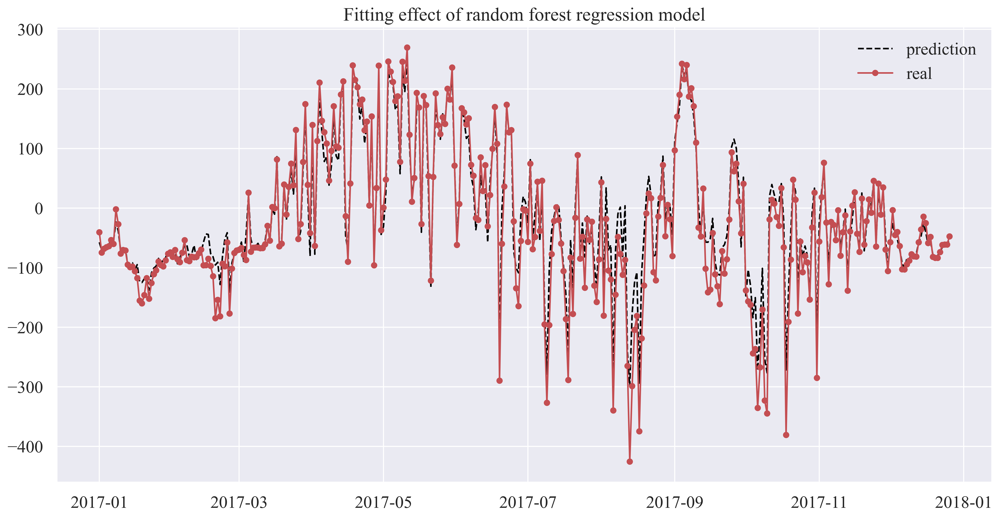

In [175]:
model1_prediction=model1.predict(df1_5['2017-01-01':])
plt.figure(figsize=(16,8),dpi=600)
plt.rc('font',family='Times New Roman',size=18)
plt.title('Fitting effect of random forest regression model')
plt.plot(pd.date_range('2017-01-01','2017-12-26'),model1_prediction,ls='--',c='black',marker='+')
plt.plot(pd.date_range('2017-01-01','2017-12-26'),df1_4['2017-01-01':]['NEE_PI_F'],c='r',marker='o')

plt.legend(['prediction','real'])
plt.show()

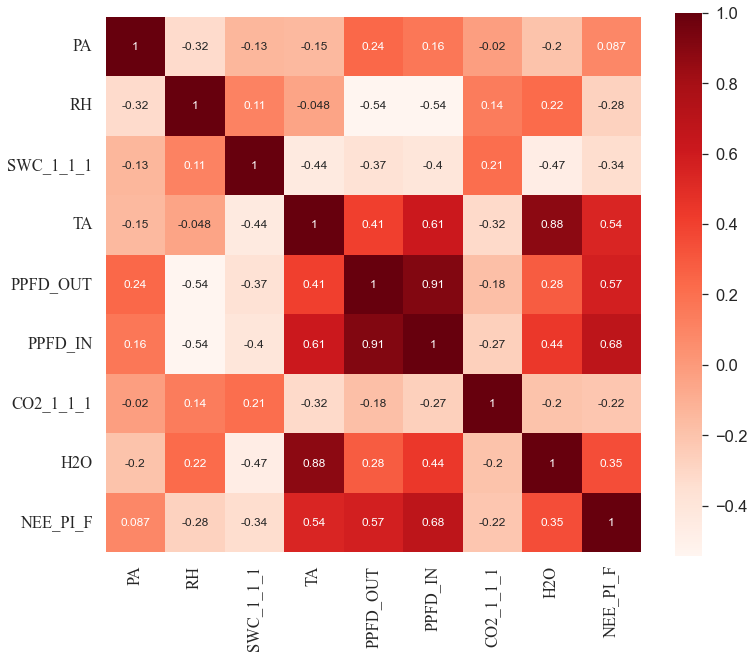

In [176]:
import seaborn as sns
#绘制各个维度之间的相关系数热力图
values=df3_4
#values.columns=['Sustainability','Energy','PPP','Production','GHG']
#列与列之间的相关系数
corr=values.corr()
fig,ax=plt.subplots(figsize=(12,10))
sns.set(font_scale=1.5)
sns.heatmap(corr, annot=True, annot_kws={'size':12}, cmap='Reds', square=True, ax=ax) #热力图
plt.rc('font',family='Times New Roman',size=12)

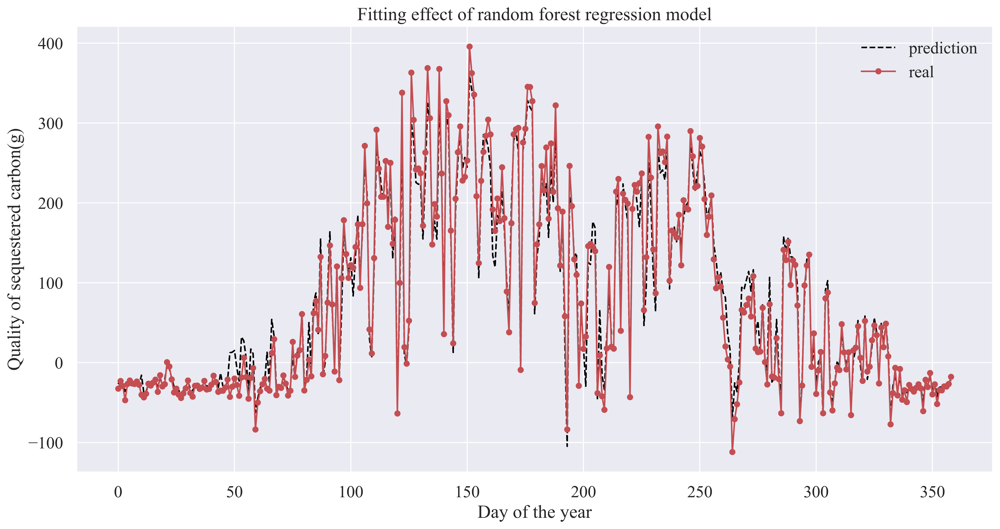

In [177]:

plt.figure(figsize=(16,8),dpi=600)
plt.rc('font',family='Times New Roman',size=18)
plt.title('Fitting effect of random forest regression model')
plt.plot(range(len(model2_prediction)),model2_prediction,ls='--',c='black',marker='+')
plt.plot(range(len(df3_4['2017-01-01':]['NEE_PI_F'])),df3_4['2017-01-01':]['NEE_PI_F'],c='r',marker='o')
plt.ylabel('Quality of sequestered carbon(g)')
plt.xlabel('Day of the year')
plt.legend(['prediction','real'])
plt.show()

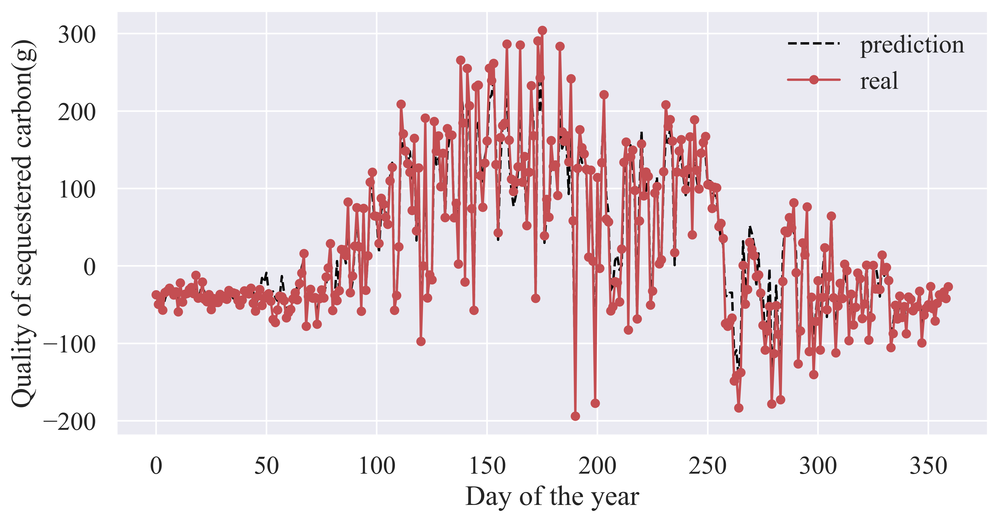

In [178]:
plt.figure(figsize=(10,5),dpi=600)
plt.rc('font',family='Times New Roman',size=30)
#plt.title('Fitting effect of random forest regression model')
plt.plot(range(len(model3_prediction)),model3_prediction,ls='--',c='black',marker='+')
plt.plot(range(len(df4_4['2017-01-01':]['NEE_PI_F'])),df4_4['2017-01-01':]['NEE_PI_F'],c='r',marker='o')
plt.ylabel('Quality of sequestered carbon(g)')
plt.xlabel('Day of the year')
plt.legend(['prediction','real'])
plt.savefig('C:/Users/Bingbing/Desktop/随机森林.png')
plt.show()

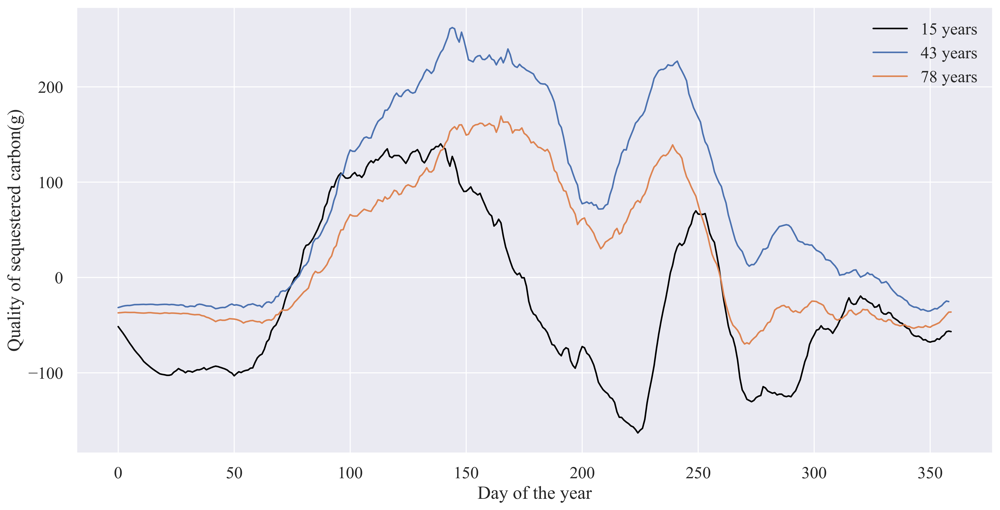

In [395]:
from scipy import signal

plt.figure(figsize=(16,8),dpi=600)
plt.rc('font',family='Times New Roman',size=18)
#plt.title('Carbon sequestration capacity of trees of different ages')
plt.plot(range(len(df1_4['2017-01-01':]['NEE_PI_F'])),signal.savgol_filter(df1_4['2017-01-01':]['NEE_PI_F'],51,2,mode='nearest'),c='black',label='15 years')
plt.plot(range(len(df3_4['2017-01-01':]['NEE_PI_F'])),signal.savgol_filter(df3_4['2017-01-01':]['NEE_PI_F'],51,2,mode='nearest'),label='43 years')
plt.plot(range(len(df4_4['2017-01-01':]['NEE_PI_F'])),signal.savgol_filter(df4_4['2017-01-01':]['NEE_PI_F'],51,2,mode='nearest'),label='78 years')
plt.ylabel('Quality of sequestered carbon(g)')
plt.xlabel('Day of the year')
plt.legend()
plt.savefig('C:/Users/Bingbing/Desktop/年龄差异.png')
plt.show()

In [180]:
error2=abs(model2_prediction-df3_4['2017-01-01':]['NEE_PI_F'].values.reshape(-1))
error2

array([5.61402317e+00, 2.82154752e+00, 5.63148288e-01, 1.09309513e+01,
       1.16275046e+00, 1.88161574e+00, 5.85356544e-01, 7.50228480e-02,
       1.62342144e-01, 3.75902208e-01, 2.44675054e+01, 6.47857958e+00,
       2.64830861e+00, 6.03873792e-01, 2.00724480e+00, 9.92082816e-01,
       1.77389222e+00, 6.09482880e+00, 5.05218125e+00, 2.44757376e+00,
       5.27454374e+00, 3.25515802e+00, 2.81246515e+00, 1.70299584e+00,
       7.31607552e+00, 2.65146048e+00, 5.55167002e+00, 4.22579981e+00,
       3.46107686e+00, 1.59524122e+00, 1.58467622e+00, 5.46963840e+00,
       6.91605734e+00, 1.87930368e-01, 6.11753472e-01, 1.13509901e+00,
       1.00606925e+00, 1.54428250e+00, 5.05243008e+00, 1.18324800e+00,
       1.21784602e+00, 9.05592960e-01, 1.51120858e+00, 4.58346470e+00,
       2.21952442e+01, 5.74683725e+00, 9.10351872e-01, 2.27722752e+00,
       5.51138930e+01, 4.31694904e+01, 3.49739597e+01, 2.14259178e+01,
       1.83977879e+01, 5.06409823e+01, 2.12111136e+01, 2.40224072e+01,
      

In [181]:
'''
参数调优：RandomizedSearchCV() 随机搜索和方格遍历搜索的方法寻求最优超参数
'''
pprint(model2.get_params())

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}


In [182]:
#首先是树的个数 n_estimators 在200到2000之间以10为间隔随机的抽取参数
n_estimators=[int(x) for x in np.linspace(start=200,stop=2000,num=10)]
max_features=['auto','sqrt']
max_depth=[10,20]
max_depth.append(None)
min_samples_split=[2,5,10]
min_samples_leaf=[1,2,4]
bootstrap=[True,False]
#将上述参数整合成字典的形式
distributions={'n_estimators':n_estimators,
               'max_features':max_features,
               'max_depth':max_depth,
               'min_samples_split':min_samples_split,
               'min_samples_leaf':min_samples_leaf,
               'bootstrap':bootstrap}
model2=RandomForestRegressor()
rf_random=RandomizedSearchCV(estimator=model2,param_distributions=distributions,n_iter=100,scoring='neg_mean_absolute_error',cv=3,random_state=0)
rf_random.fit(df3_5,df3_4['NEE_PI_F'])

In [183]:
#找出最优模型
model1_best=rf_random.best_estimator_
model1_best_prediction=model1_best.predict(df3_5['2017-01-01':])
'''
评估模型 误差绝对值均值、平均绝对误差、准确度（100-平均绝对误差）
'''
error3=abs(model1_best_prediction-df3_4['2017-01-01':]['NEE_PI_F'].values.reshape(-1))
error3

In [874]:
pprint(rf_random.best_params_)

AttributeError: 'RandomizedSearchCV' object has no attribute 'best_params_'

In [185]:
# #下面使用GridSearchCV 在随机搜索的两侧遍历出结果，对比相应的结果
# n_estimators=[1200,1300,1100]
# max_features=['auto']
# max_depth=[20]
#
# min_samples_split=[5,6,7,8]
# min_samples_leaf=[1,2,3]
# bootstrap=[True]
# #将上述参数整合成字典的形式
# distributions={'n_estimators':n_estimators,
#                'max_features':max_features,
#                'max_depth':max_depth,
#                'min_samples_split':min_samples_split,
#                'min_samples_leaf':min_samples_leaf,
#                'bootstrap':bootstrap}
# rf=RandomForestRegressor()
# rf_grid=GridSearchCV(estimator=rf,param_grid=distributions,scoring='neg_mean_absolute_error',cv=3)
# rf_grid.fit(df3_5,df3_4['NEE_PI_F'])

In [186]:
pprint(rf_grid.best_params_)

{'bootstrap': True,
 'max_depth': 20,
 'max_features': 'auto',
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 1100}


In [187]:
#找出最优模型
model2_best=rf_grid.best_estimator_
model2_best_prediction=model2_best.predict(df3_5['2017-01-01':])
'''
评估模型 误差绝对值均值、平均绝对误差、准确度（100-平均绝对误差）
'''
error4=abs(model2_best_prediction-df3_4['2017-01-01':]['NEE_PI_F'].values.reshape(-1))
error4

array([6.27038242e+00, 4.19027877e+00, 1.36338857e+00, 7.91598877e+00,
       1.56930829e+00, 2.21115866e+00, 2.32738951e-01, 7.66019579e-04,
       2.00882772e-01, 4.83975383e-01, 2.89374799e+01, 1.00308236e+01,
       4.99000627e+00, 6.15615109e-01, 2.77700995e+00, 1.43629347e+00,
       1.57081560e+00, 8.04153027e+00, 6.63957380e+00, 4.05136204e+00,
       2.23769000e+01, 1.87428947e+00, 7.64025759e+00, 9.58215274e-02,
       1.10463634e+01, 4.41391562e+00, 6.23327187e+00, 7.77208209e+00,
       7.41993802e+00, 2.36992209e+00, 5.46715221e-01, 6.19610970e+00,
       9.96298984e+00, 2.09178406e+00, 1.57765446e+00, 1.01107124e+00,
       5.38114774e-02, 2.95338095e+00, 5.00320885e+00, 9.38570891e-01,
       2.31980913e+00, 5.84773363e-01, 2.57289620e+00, 3.24231944e+00,
       2.46530675e+01, 6.05959633e+00, 4.37111408e-02, 2.93929959e+00,
       8.77756231e+01, 7.04098526e+01, 3.55440712e+01, 2.94406194e+01,
       3.94292050e+01, 6.72587078e+01, 2.92882537e+01, 3.63700592e+01,
      

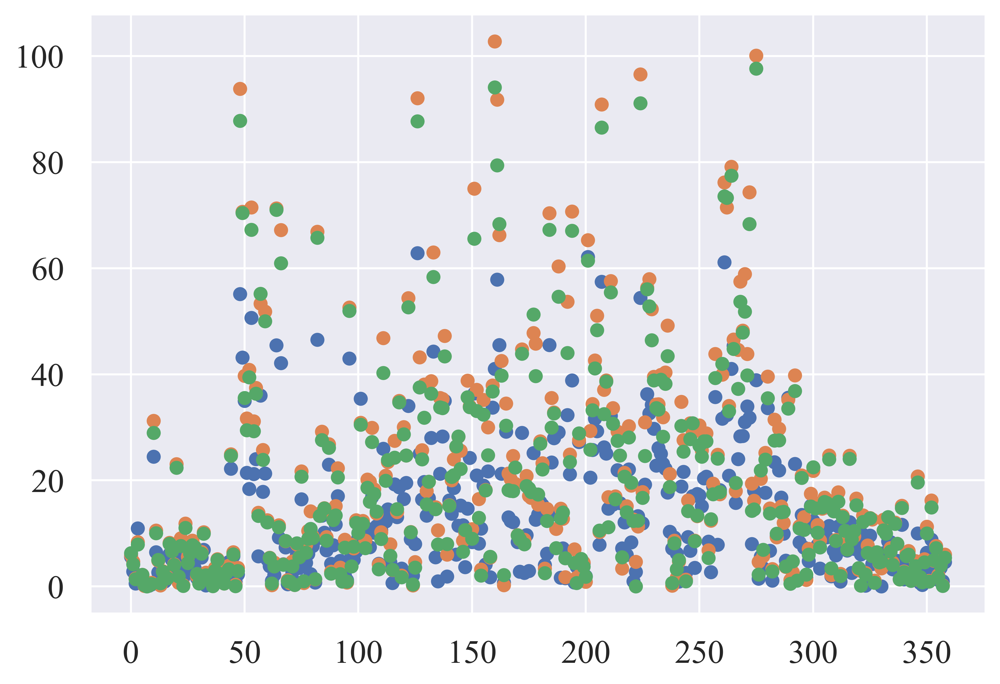

In [188]:
plt.figure(dpi=600)
plt.rc('font',family='Times New Roman',size=18)
plt.scatter(range(len(error2)),error2)
plt.scatter(range(len(error2)),error3)
plt.scatter(range(len(error2)),error4)
plt.savefig('C:/Users/Bingbing/Desktop/误差分析.jpg')
plt.show()

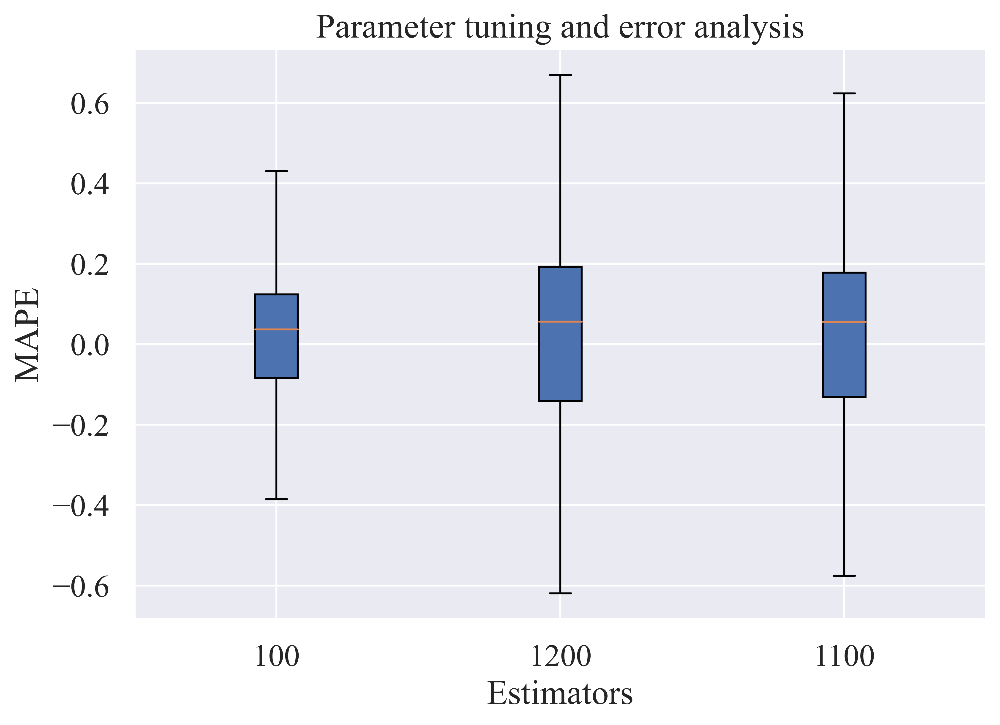

In [189]:
MAPE2=error2/df3_4['2017-01-01':]['NEE_PI_F'].values.reshape(-1)
MAPE3=error3/df3_4['2017-01-01':]['NEE_PI_F'].values.reshape(-1)
MAPE4=error4/df3_4['2017-01-01':]['NEE_PI_F'].values.reshape(-1)

plt.figure(dpi=600)
plt.title('Parameter tuning and error analysis')
plt.rc('font',family='Times New Roman',size=18)
plt.boxplot(MAPE2,positions=[1],patch_artist=True,
                showmeans=False, showfliers=False)
plt.boxplot(MAPE3,positions=[2],patch_artist=True,
                showmeans=False, showfliers=False)
plt.boxplot(MAPE4,positions=[3],patch_artist=True,
                showmeans=False, showfliers=False)
plt.xlabel('Estimators')
plt.ylabel('MAPE')
plt.xticks([1,2,3],[100,1200,1100])
plt.savefig('C:/Users/Bingbing/Desktop/误差分析.jpg')
plt.show()

In [190]:
'''
预测不同年龄的树木的时间上的影响效果
1 78
2 43
3 15
'''
df1_6=df1_4['NEE_PI_F'].groupby(pd.Grouper(freq='Y')).sum()
df3_6=df3_4['NEE_PI_F'].groupby(pd.Grouper(freq='Y')).sum()
df4_6=df4_4['NEE_PI_F'].groupby(pd.Grouper(freq='Y')).sum()
df1_6['2014-12-31']=8900
df1_6['2016-12-31']=8200
df1_6['2017-12-31']=8000

In [191]:
df1_6=pd.DataFrame(df1_6)
df1_6

,NEE_PI_F
TIMESTAMP_START,
2010-12-31,10016.451187
2011-12-31,9040.847270
2012-12-31,9214.779802
2013-12-31,10105.661606
2014-12-31,8900.000000
2015-12-31,7725.458074
2016-12-31,8200.000000
2017-12-31,8000.000000


In [279]:
df3_6

TIMESTAMP_START
2008-12-31    12048.833203
2009-12-31    13057.400102
2010-12-31    23718.820723
2011-12-31    18342.901786
2012-12-31    23675.585126
2013-12-31    23365.233562
2014-12-31    37041.646810
2015-12-31    39116.388326
2016-12-31    23160.401280
2017-12-31    29112.770650
Freq: A-DEC, Name: NEE_PI_F, dtype: float64

In [192]:
df1_6['ds']=pd.date_range('2010-12-31',freq='A',periods=8)
df1_6['y']=df1_6['NEE_PI_F']
df1_6

,NEE_PI_F,ds,y
TIMESTAMP_START,,,
2010-12-31,10016.451187,2010-12-31,10016.451187
2011-12-31,9040.847270,2011-12-31,9040.847270
2012-12-31,9214.779802,2012-12-31,9214.779802
2013-12-31,10105.661606,2013-12-31,10105.661606
2014-12-31,8900.000000,2014-12-31,8900.000000
2015-12-31,7725.458074,2015-12-31,7725.458074
2016-12-31,8200.000000,2016-12-31,8200.000000
2017-12-31,8000.000000,2017-12-31,8000.000000


In [254]:
'''
趋势灵活性 changepoint_prior_scale - 0.9
        不确定区间 interval_width - 0.9
        断点区间 changepoint_range - default 0.8
'''
#使用逻辑回归的方法 需要设置capcity的值 5080663
m=Prophet(growth='logistic',n_changepoints=-1,changepoint_range=0.1)
df1_6['floor']=6000
df1_6['cap']=10000
#拟合模型
m.fit(df1_6)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [255]:
#计算预测值 periods表示需要预测的点数 freq 表示预测的频率
future=m.make_future_dataframe(periods=3,freq='A')
future['floor']=6000
future['cap']=10000
forecast=m.predict(future)

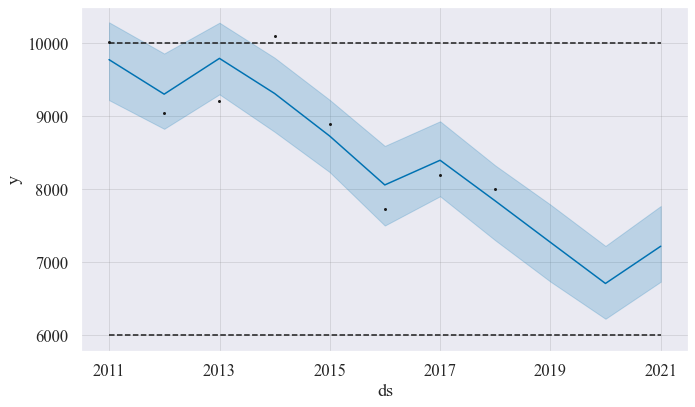

In [256]:
fig = m.plot(forecast)

In [326]:
t=df1_6['NEE_PI_F'].values
t

array([10016.4511872,  9040.8472704,  9214.7798016, 10105.6616064,
        8900.       ,  7725.4580736,  8200.       ,  8000.       ])

[10016.4511872 19057.2984576 28272.0782592 38377.7398656 47277.7398656
 55003.1979392 63203.1979392 71203.1979392]
[[14536.8748224]
 [23664.6883584]
 [33324.9090624]
 [42827.7398656]
 [51140.4689024]
 [59103.1979392]
 [67203.1979392]]
[[-1.45368748e+04  1.00000000e+00]
 [-2.36646884e+04  1.00000000e+00]
 [-3.33249091e+04  1.00000000e+00]
 [-4.28277399e+04  1.00000000e+00]
 [-5.11404689e+04  1.00000000e+00]
 [-5.91031979e+04  1.00000000e+00]
 [-6.72031979e+04  1.00000000e+00]]


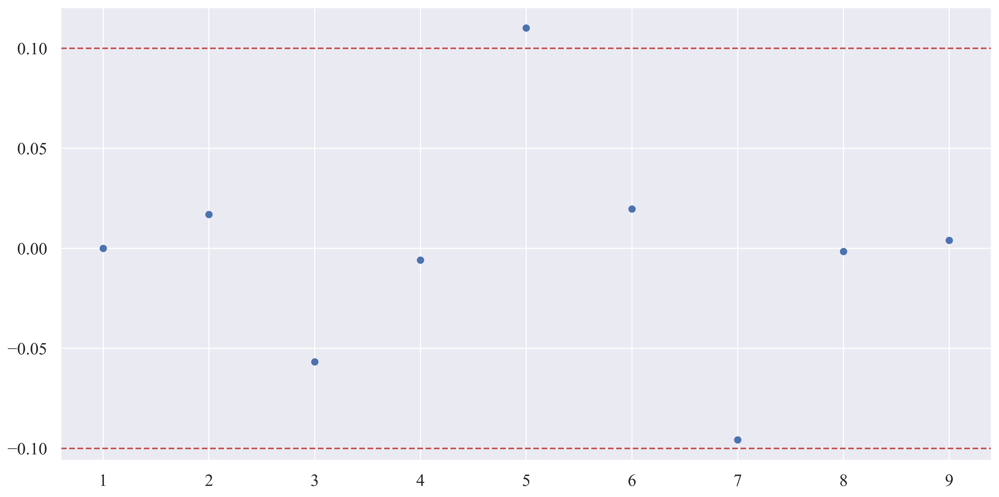

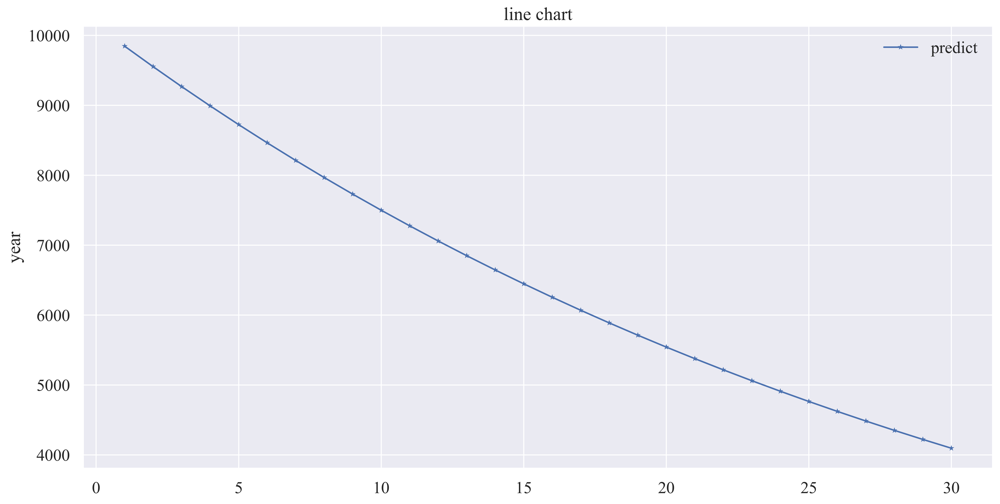

In [327]:
#将数列进行一次累加求和
t1=np.cumsum(t)
print(t1)
min=math.e**(-2/(len(t)+1))
max=math.e**(2/(len(t)+2))
#首先验证阶比是否满足条件
for i in range(2,len(t)):
    j=t[i-1]/t[i]
    if(j<min or j>max):
        print(i)
#生成邻均值数列（相邻两个数据的均值）
z1= ((t1[:len(t1) - 1] + t1[1:])/2.0).reshape(-1,1)

print(z1)
Y=t[1:].reshape(-1,1)
B=np.append(-z1,np.ones_like(z1),axis=1)
print(B)
#使用最小二乘法求解a，b的值（感谢大佬铺路）
[[a],[b]] = np.dot(np.dot(np.linalg.inv(np.dot(B.T, B)), B.T), Y)#计算待估参数
#第i时刻的预测值，解一阶累加得到的方程（注意下标 2，3，4，.....）
#predict=(t[0]-b/a)*np.exp(-a*(i-1))-(t[0]-b/a)*np.exp(-a*(i-2))
residual=np.array([0])
predict_list=[]
for i in range(0,len(t)):
    predict=(t[0]-b/a)*np.exp(-a*(i))-(t[0]-b/a)*np.exp(-a*(i-1))
    predict_list.append(predict-1)
    residual=np.append(residual,(t[i]-predict)/t[i])
plt.figure(figsize=(16,8),dpi=600)
plt.scatter(np.array([i+1 for i in range(len(residual))]),residual)
plt.axhline(y=0.10,ls='--',c='r')
plt.axhline(y=-0.1,ls='--',c='r')
plt.show()
#绘制预测数据的分布图像
predict_list3=[]
for i in range(0,30):
    predict=(t[0]-b/a)*np.exp(-a*(i))-(t[0]-b/a)*np.exp(-a*(i-1))
    predict_list3.append(predict-1)
plt.figure(figsize=(16,8),dpi=600)
plt.title('line chart')
plt.plot([i+1 for i in range(len(predict_list3))],predict_list3,marker='*')
#plt.plot([i+1 for i in range(len(predict_list))],t-1,marker='o')
plt.ylabel('year')
#注意legend里面传的参数是列表
plt.legend(['predict','true'])
plt.show()

In [328]:
t=df3_6.values
t

array([12048.8332032, 13057.4001024, 23718.8207232, 18342.9017856,
       23675.5851264, 23365.2335616, 37041.6468096, 39116.3883264,
       23160.40128  , 29112.7706496])

[ 12048.8332032  25106.2333056  48825.0540288  67167.9558144
  90843.5409408 114208.7745024 151250.421312  190366.8096384
 213527.2109184 242639.981568 ]
2
3
4
6
8
9
[[ 18577.5332544]
 [ 36965.6436672]
 [ 57996.5049216]
 [ 79005.7483776]
 [102526.1577216]
 [132729.5979072]
 [170808.6154752]
 [201947.0102784]
 [228083.5962432]]
[[-1.85775333e+04  1.00000000e+00]
 [-3.69656437e+04  1.00000000e+00]
 [-5.79965049e+04  1.00000000e+00]
 [-7.90057484e+04  1.00000000e+00]
 [-1.02526158e+05  1.00000000e+00]
 [-1.32729598e+05  1.00000000e+00]
 [-1.70808615e+05  1.00000000e+00]
 [-2.01947010e+05  1.00000000e+00]
 [-2.28083596e+05  1.00000000e+00]]


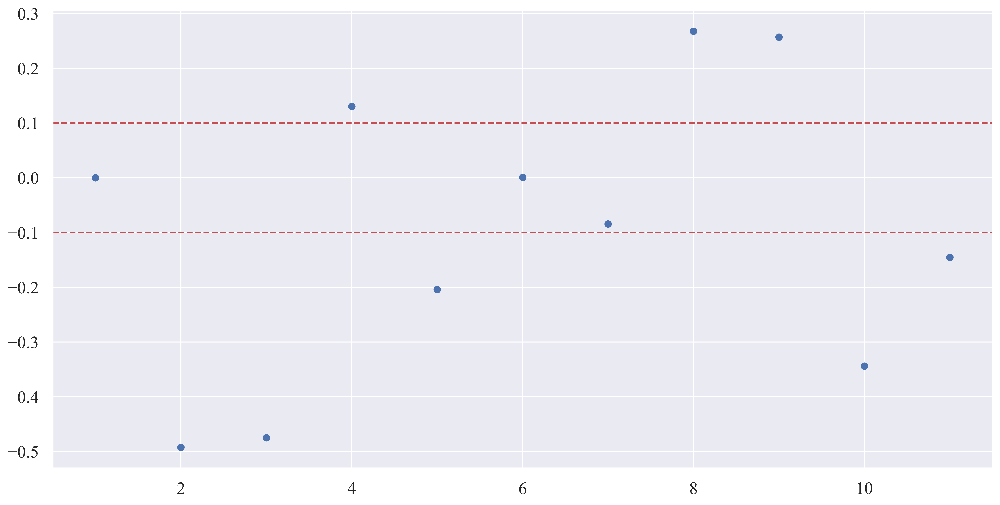

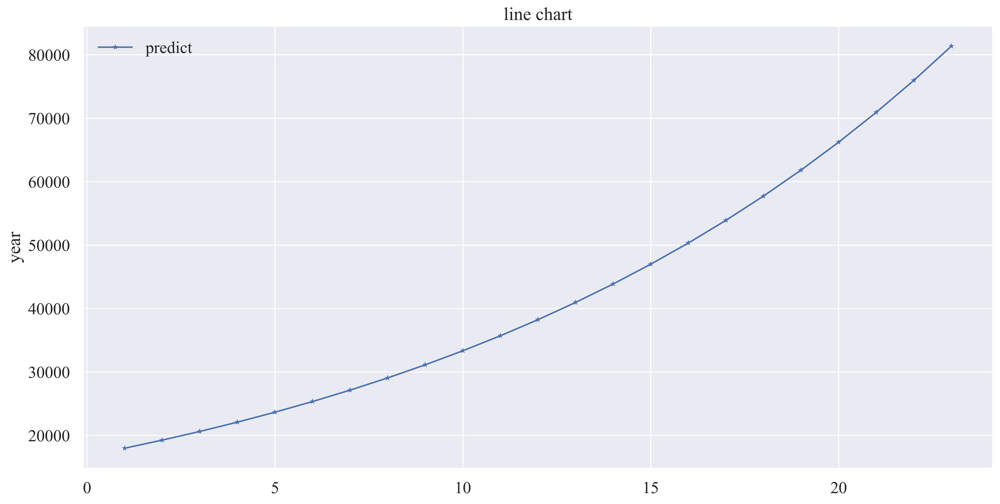

In [329]:
#将数列进行一次累加求和
t1=np.cumsum(t)
print(t1)
min=math.e**(-2/(len(t)+1))
max=math.e**(2/(len(t)+2))
#首先验证阶比是否满足条件
for i in range(2,len(t)):
    j=t[i-1]/t[i]
    if(j<min or j>max):
        print(i)
#生成邻均值数列（相邻两个数据的均值）
z1= ((t1[:len(t1) - 1] + t1[1:])/2.0).reshape(-1,1)

print(z1)
Y=t[1:].reshape(-1,1)
B=np.append(-z1,np.ones_like(z1),axis=1)
print(B)
#使用最小二乘法求解a，b的值（感谢大佬铺路）
[[a],[b]] = np.dot(np.dot(np.linalg.inv(np.dot(B.T, B)), B.T), Y)#计算待估参数
#第i时刻的预测值，解一阶累加得到的方程（注意下标 2，3，4，.....）
#predict=(t[0]-b/a)*np.exp(-a*(i-1))-(t[0]-b/a)*np.exp(-a*(i-2))
residual=np.array([0])
predict_list=[]
for i in range(0,len(t)):
    predict=(t[0]-b/a)*np.exp(-a*(i))-(t[0]-b/a)*np.exp(-a*(i-1))
    predict_list.append(predict-1)
    residual=np.append(residual,(t[i]-predict)/t[i])
plt.figure(figsize=(16,8),dpi=600)
plt.scatter(np.array([i+1 for i in range(len(residual))]),residual)
plt.axhline(y=0.10,ls='--',c='r')
plt.axhline(y=-0.1,ls='--',c='r')
plt.show()
#绘制预测数据的分布图像
predict_list2=[]
for i in range(0,23):
    predict=(t[0]-b/a)*np.exp(-a*(i))-(t[0]-b/a)*np.exp(-a*(i-1))
    predict_list2.append(predict-1)
plt.figure(figsize=(16,8),dpi=600)
plt.title('line chart')
plt.plot([i+1 for i in range(len(predict_list2))],predict_list2,marker='*')
#plt.plot([i+1 for i in range(len(predict_list))],t-1,marker='o')
plt.ylabel('year')
#注意legend里面传的参数是列表
plt.legend(['predict','true'])
plt.show()

In [330]:
t=df4_6.values
t

array([ 6781.8943872,  2227.5212544,  5136.4813824,  8779.9946112,
        8171.6045184, 10782.9512064, 14820.7936896,  9434.4124032,
        9087.4078848,  3112.4601216, 11828.82528  ,  5147.4258432,
       17261.6811264,   269.8541568,  9300.97728  ])

[  6781.8943872   9009.4156416  14145.897024   22925.8916352
  31097.4961536  41880.44736    56701.2410496  66135.6534528
  75223.0613376  78335.5214592  90164.3467392  95311.7725824
 112573.4537088 112843.3078656 122144.2851456]
2
3
5
6
7
9
10
11
12
13
14
[[  7895.6550144]
 [ 11577.6563328]
 [ 18535.8943296]
 [ 27011.6938944]
 [ 36488.9717568]
 [ 49290.8442048]
 [ 61418.4472512]
 [ 70679.3573952]
 [ 76779.2913984]
 [ 84249.9340992]
 [ 92738.0596608]
 [103942.6131456]
 [112708.3807872]
 [117493.7965056]]
[[-7.89565501e+03  1.00000000e+00]
 [-1.15776563e+04  1.00000000e+00]
 [-1.85358943e+04  1.00000000e+00]
 [-2.70116939e+04  1.00000000e+00]
 [-3.64889718e+04  1.00000000e+00]
 [-4.92908442e+04  1.00000000e+00]
 [-6.14184473e+04  1.00000000e+00]
 [-7.06793574e+04  1.00000000e+00]
 [-7.67792914e+04  1.00000000e+00]
 [-8.42499341e+04  1.00000000e+00]
 [-9.27380597e+04  1.00000000e+00]
 [-1.03942613e+05  1.00000000e+00]
 [-1.12708381e+05  1.00000000e+00]
 [-1.17493797e+05  1.00000000e+00]]

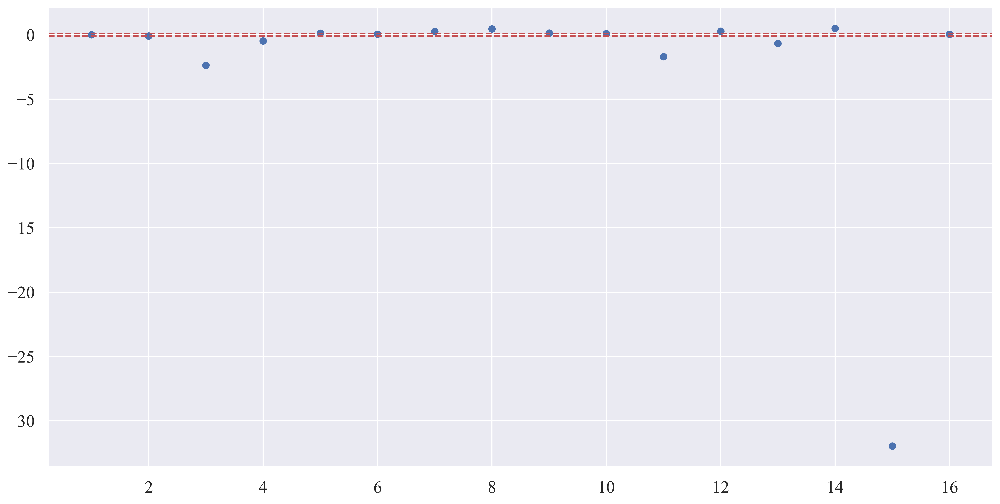

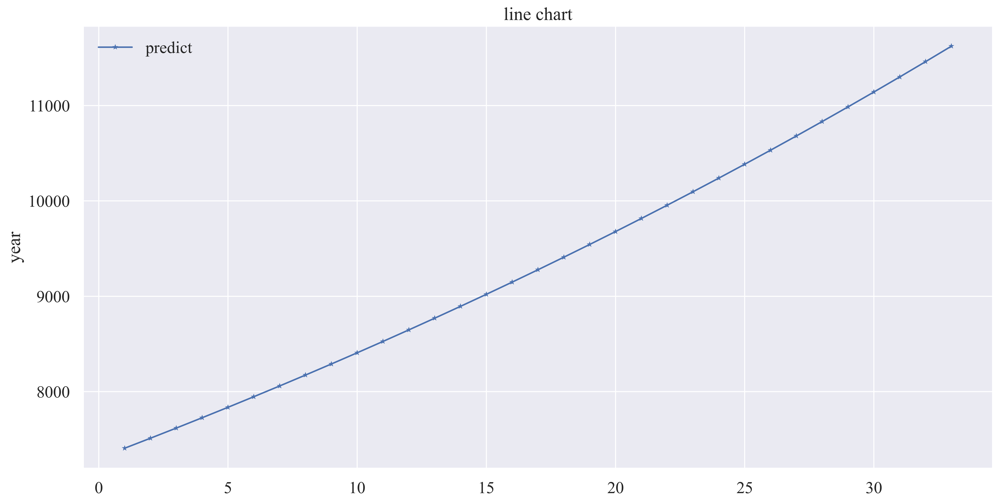

In [331]:
#将数列进行一次累加求和
t1=np.cumsum(t)
print(t1)
min=math.e**(-2/(len(t)+1))
max=math.e**(2/(len(t)+2))
#首先验证阶比是否满足条件
for i in range(2,len(t)):
    j=t[i-1]/t[i]
    if(j<min or j>max):
        print(i)
#生成邻均值数列（相邻两个数据的均值）
z1= ((t1[:len(t1) - 1] + t1[1:])/2.0).reshape(-1,1)

print(z1)
Y=t[1:].reshape(-1,1)
B=np.append(-z1,np.ones_like(z1),axis=1)
print(B)
#使用最小二乘法求解a，b的值（感谢大佬铺路）
[[a],[b]] = np.dot(np.dot(np.linalg.inv(np.dot(B.T, B)), B.T), Y)#计算待估参数
#第i时刻的预测值，解一阶累加得到的方程（注意下标 2，3，4，.....）
#predict=(t[0]-b/a)*np.exp(-a*(i-1))-(t[0]-b/a)*np.exp(-a*(i-2))
residual=np.array([0])
predict_list=[]
for i in range(0,len(t)):
    predict=(t[0]-b/a)*np.exp(-a*(i))-(t[0]-b/a)*np.exp(-a*(i-1))
    predict_list.append(predict-1)
    residual=np.append(residual,(t[i]-predict)/t[i])
plt.figure(figsize=(16,8),dpi=600)
plt.scatter(np.array([i+1 for i in range(len(residual))]),residual)
plt.axhline(y=0.10,ls='--',c='r')
plt.axhline(y=-0.1,ls='--',c='r')
plt.show()
#绘制预测数据的分布图像
predict_list1=[]
for i in range(0,33):
    predict=(t[0]-b/a)*np.exp(-a*(i))-(t[0]-b/a)*np.exp(-a*(i-1))
    predict_list1.append(predict-1)
plt.figure(figsize=(16,8),dpi=600)
plt.title('line chart')
plt.plot([i+1 for i in range(len(predict_list1))],predict_list1,marker='*')
#plt.plot([i+1 for i in range(len(predict_list))],t-1,marker='o')
plt.ylabel('year')
#注意legend里面传的参数是列表
plt.legend(['predict','true'])
plt.show()

In [332]:
len(predict_list1)

33

In [333]:
len(predict_list2)

23

In [334]:
len(predict_list3)

30

In [335]:
df1_6['NEE_PI_F'].values

array([10016.4511872,  9040.8472704,  9214.7798016, 10105.6616064,
        8900.       ,  7725.4580736,  8200.       ,  8000.       ])

In [336]:
t=df1_6['NEE_PI_F'].values[::-1]

[ 8000.        16200.        23925.4580736 32825.4580736 42931.11968
 52145.8994816 61186.746752  71203.1979392]
[[12100.       ]
 [20062.7290368]
 [28375.4580736]
 [37878.2888768]
 [47538.5095808]
 [56666.3231168]
 [66194.9723456]]
[[-1.21000000e+04  1.00000000e+00]
 [-2.00627290e+04  1.00000000e+00]
 [-2.83754581e+04  1.00000000e+00]
 [-3.78782889e+04  1.00000000e+00]
 [-4.75385096e+04  1.00000000e+00]
 [-5.66663231e+04  1.00000000e+00]
 [-6.61949723e+04  1.00000000e+00]]


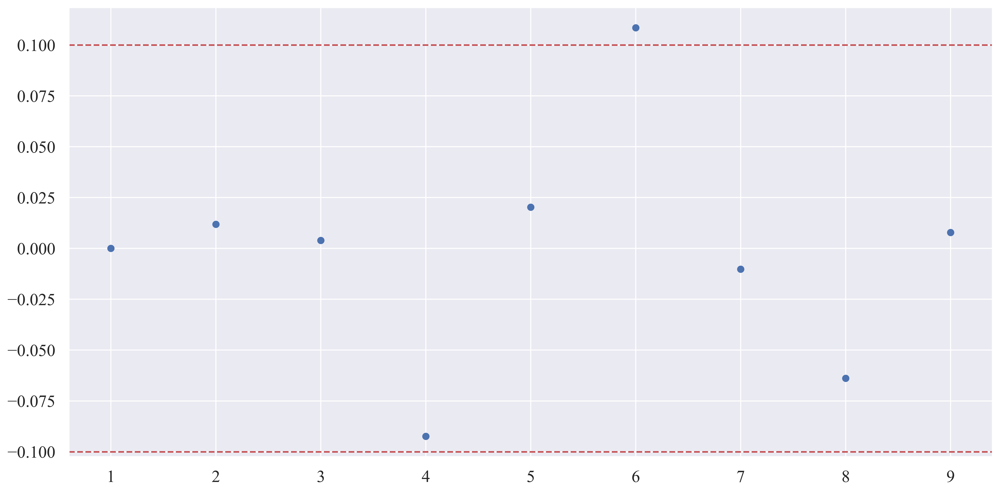

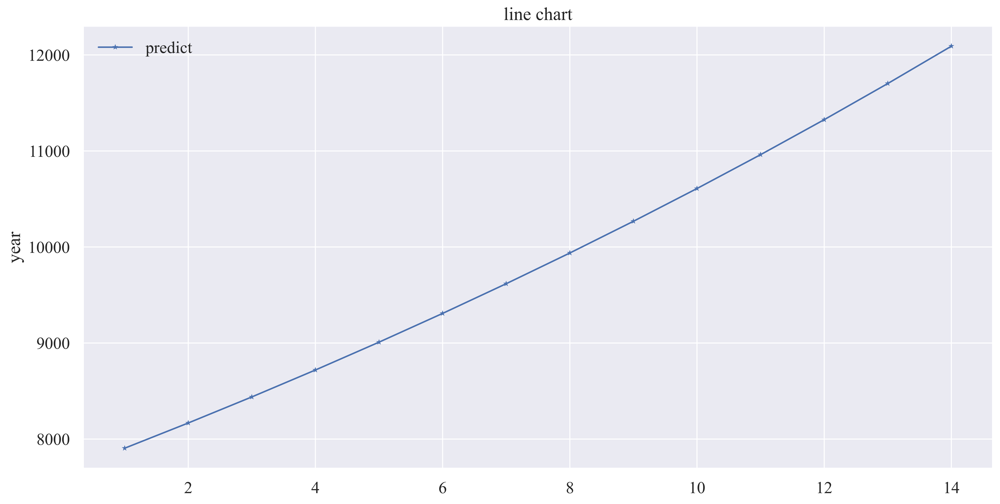

In [337]:
#将数列进行一次累加求和
t1=np.cumsum(t)
print(t1)
min=math.e**(-2/(len(t)+1))
max=math.e**(2/(len(t)+2))
#首先验证阶比是否满足条件
for i in range(2,len(t)):
    j=t[i-1]/t[i]
    if(j<min or j>max):
        print(i)
#生成邻均值数列（相邻两个数据的均值）
z1= ((t1[:len(t1) - 1] + t1[1:])/2.0).reshape(-1,1)

print(z1)
Y=t[1:].reshape(-1,1)
B=np.append(-z1,np.ones_like(z1),axis=1)
print(B)
#使用最小二乘法求解a，b的值（感谢大佬铺路）
[[a],[b]] = np.dot(np.dot(np.linalg.inv(np.dot(B.T, B)), B.T), Y)#计算待估参数
#第i时刻的预测值，解一阶累加得到的方程（注意下标 2，3，4，.....）
#predict=(t[0]-b/a)*np.exp(-a*(i-1))-(t[0]-b/a)*np.exp(-a*(i-2))
residual=np.array([0])
predict_list=[]
for i in range(0,len(t)):
    predict=(t[0]-b/a)*np.exp(-a*(i))-(t[0]-b/a)*np.exp(-a*(i-1))
    predict_list.append(predict-1)
    residual=np.append(residual,(t[i]-predict)/t[i])
plt.figure(figsize=(16,8),dpi=600)
plt.scatter(np.array([i+1 for i in range(len(residual))]),residual)
plt.axhline(y=0.10,ls='--',c='r')
plt.axhline(y=-0.1,ls='--',c='r')
plt.show()
#绘制预测数据的分布图像
predict_list4=[]
for i in range(0,14):
    predict=(t[0]-b/a)*np.exp(-a*(i))-(t[0]-b/a)*np.exp(-a*(i-1))
    predict_list4.append(predict-1)
plt.figure(figsize=(16,8),dpi=600)
plt.title('line chart')
plt.plot([i+1 for i in range(len(predict_list4))],predict_list4,marker='*')
#plt.plot([i+1 for i in range(len(predict_list))],t-1,marker='o')
plt.ylabel('year')
#注意legend里面传的参数是列表
plt.legend(['predict','true'])
plt.show()

In [338]:
y=predict_list1+predict_list2+predict_list4[::-1]+predict_list3
print(len(y))
print(len(predict_list1),len(predict_list2),len(predict_list3),len(predict_list4))

100
33 23 30 14


<AxesSubplot:>

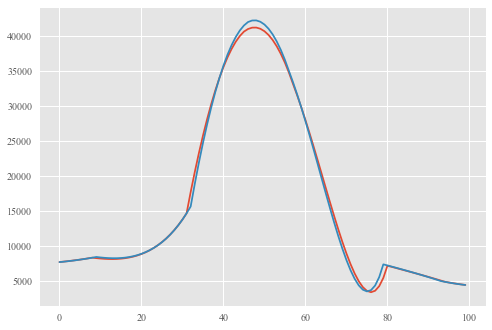

In [816]:
df_y=pd.DataFrame({'ds':pd.date_range('2020-01-01',freq='D',periods=100),'y':y})
#df_y['y'].plot()
#数据的平滑处理
from scipy import signal
# df_y['y']=signal.savgol_filter(df_y['y'],51,2,mode='nearest')
# df_y['y'].plot()
df_y['y1']=signal.savgol_filter(df_y['y'],49,2,mode='nearest')
df_y['y1'].plot()
df_y['y2']=signal.savgol_filter(df_y['y'],47,2,mode='nearest')
df_y['y2'].plot()

In [792]:
'''
趋势灵活性 changepoint_prior_scale - 0.9
        不确定区间 interval_width - 0.9
        断点区间 changepoint_range - default 0.8
'''
#使用逻辑回归的方法 需要设置capcity的值 5080663
m=Prophet(changepoint_prior_scale=1.0,interval_width=0.5,changepoint_range=1,growth='logistic')
df_y['floor']=6000
df_y['cap']=40000
#拟合模型
m.fit(df_y)
#计算预测值 periods表示需要预测的点数 freq 表示预测的频率
future=m.make_future_dataframe(periods=10,freq='D')
future['floor']=6000
future['cap']=40000
forecast1=m.predict(future)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [793]:
m=Prophet(changepoint_prior_scale=1.0,interval_width=0.8,changepoint_range=1,growth='logistic')
df_y['floor']=6000
df_y['cap']=40000
#拟合模型
m.fit(df_y)
#计算预测值 periods表示需要预测的点数 freq 表示预测的频率
future=m.make_future_dataframe(periods=10,freq='D')
future['floor']=6000
future['cap']=40000
forecast2=m.predict(future)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<AxesSubplot:>

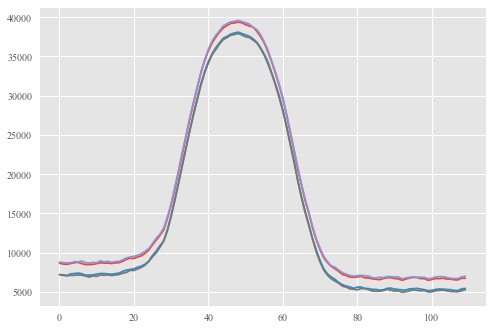

In [813]:
forecast1['yhat_upper'].plot()
forecast1['yhat_lower'].plot()
forecast2['yhat_upper'].plot()
forecast2['yhat_lower'].plot()

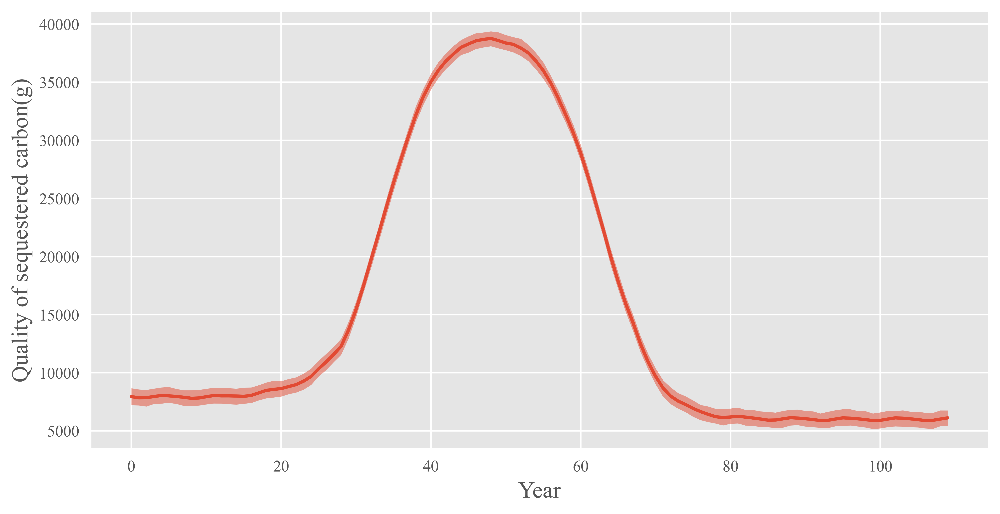

In [795]:
fig, ax = plt.subplots(dpi=600,figsize=(10,5))

ax.fill_between(range(len(forecast1['yhat_upper'])),forecast1['yhat_lower'], forecast1['yhat_upper'], alpha=.5, linewidth=0)
forecast['yhat'].plot(linewidth=2)
plt.xlabel('Year')
plt.ylabel('Quality of sequestered carbon(g)')
plt.savefig('C:/Users/Bingbing/Desktop/年龄.jpg')


plt.show()

In [796]:
year_df=pd.DataFrame(forecast['yhat'])
year_df.to_csv('C:/Users/Bingbing/Desktop/年龄.csv')

In [797]:
score_list=[]
#首先考虑只有110棵树的情况（100棵树的年龄均匀分布） x 是比例，x是砍伐时间间隔
for x in range(1,110):
    a=1000*5232*0.4232*(0.47*0.5*(0.98**x)+0.25*0.5*(0.707**x)+0.28*0.468*(0.98**x))*x
    sum1=0
    sum2=0
    for j in range(1,x+1):
        #首先是计算一年的固定二氧化碳的量
        for i in range(x):
            b=year_df['yhat'][i]*x
            c=0
            #下面确定没砍掉树的固碳量
            for k in range(110-x):
                d=year_df['yhat'][k+j]
                c=c+d
        sum1=sum1+b
        sum2=sum2+c
    sum=sum1+sum2+a
    score_list.append(sum)

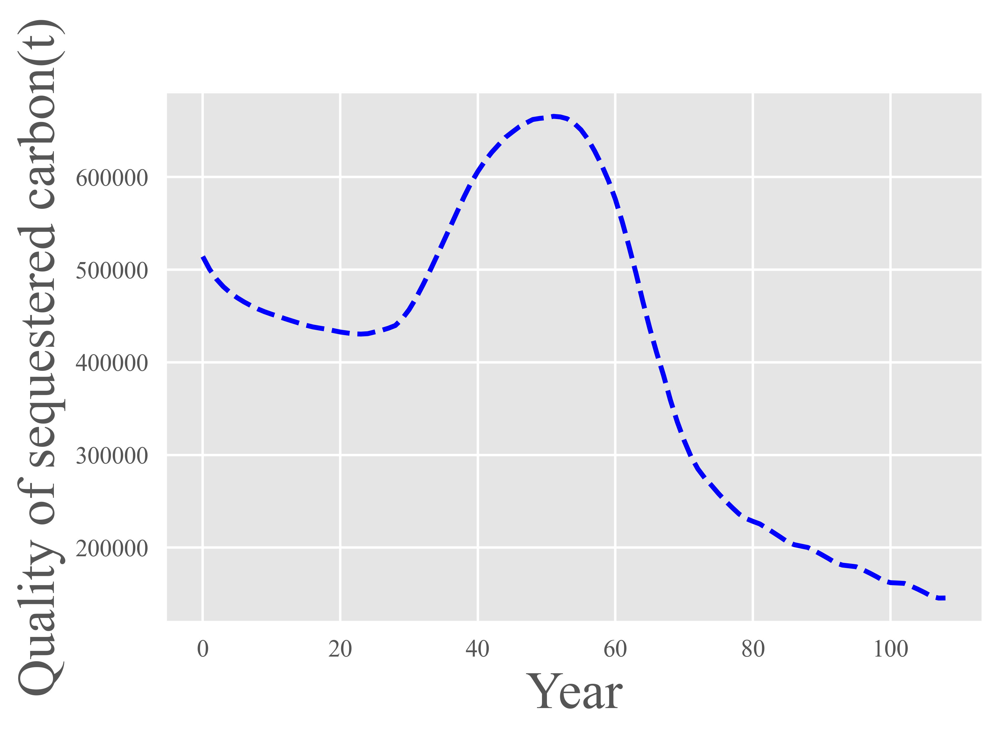

In [798]:
plt.figure(figsize=(6,4),dpi=600)
plt.rc('font',family='Times New Roman',size=18)
plt.plot(range(len(score_list)),[score_list[i]*0.19146/(i+1)  for i in range(len(score_list))],ls='--',c='blue',linewidth=2)
plt.xlabel('Year')
plt.ylabel('Quality of sequestered carbon(t)')
plt.savefig('C:/Users/Bingbing/Desktop/第一问.jpg')
CSC_list=[score_list[i]*0.19146/(i+1)  for i in range(len(score_list))]

In [799]:
[score_list[i]*0.19146/(i+1)  for i in range(len(score_list))].index(np.max([score_list[i]*0.19146/(i+1)  for i in range(len(score_list))]))

51

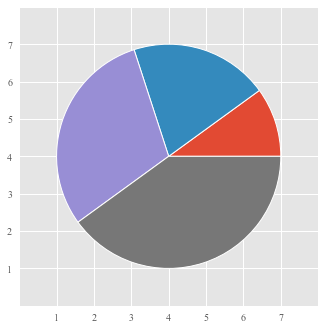

In [800]:
import matplotlib.pyplot as plt
import numpy as np

plt.style.use('ggplot')

# make data
x = [1, 2, 3, 4]


# plot
fig, ax = plt.subplots()
ax.pie(x, radius=3, center=(4, 4),
       wedgeprops={"linewidth": 1, "edgecolor": "white"}, frame=True)

ax.set(xlim=(0, 8), xticks=np.arange(1, 8),
       ylim=(0, 8), yticks=np.arange(1, 8))

plt.show()

In [801]:
from matplotlib import style
print(style.available)

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


In [826]:
'''
层次分析法的权重：固碳量：0.44097 经济：0.31182 水的保持：0.12360 土壤：0.12360
                     0.3316 0.1972 0.1394
首先是对一个树木的情况进行分析：
s 是面积（1公顷种植256棵） CSC 相对于松树的指标 生命周期lifetime 采伐的强度 0.05，0.1，0.2，0.3，0.4，0.5 个生命周期
'''
s=850
CSC=0.8776
lifetime=90
price=94675.3790
def func(s,CSC,lifetime,price):
    w2=0.31182
    w1=0.44097*(1-0.1)
    w3=0.12360
    w4=0.12360
    strength=np.linspace(0.3,0.9,2000)
    economy=[]
    Total_C=[]
    water=[]
    soil=[]
    score_list2=[]
    for i in strength:
        each_C=score_list[int(i*109)]*s*400*CSC/110
        #收获的频率，然后平均到每一年上
        each_economy=s*i*price/(i*lifetime*i)
        each_soil=s*10*282.17*(1-i)/(30)
        each_water=131.6*s*0.67*(1-i)
        economy.append(each_economy)
        Total_C.append(each_C)
        water.append(each_water)
        soil.append(each_soil)
    for i in range(len(strength)):
        score=MinMaxScaler().fit_transform(np.array(economy).reshape(-1,1))[i]*w2+MinMaxScaler().fit_transform(np.array(Total_C).reshape(-1,1))[i]*w1+MinMaxScaler().fit_transform(np.array(water).reshape(-1,1))[i]*w3+MinMaxScaler().fit_transform(np.array(soil).reshape(-1,1))[i]*w4
        score_list2.append(score)
    score_list2=[float(i) for i in score_list2]
    return Total_C,economy,water,soil,score_list2

In [817]:
df_final1=pd.DataFrame()
df_final2=pd.DataFrame()
df_final3=pd.DataFrame()
df_final4=pd.DataFrame()
df_final5=pd.DataFrame()
df_final6=pd.DataFrame()
df_final7=pd.DataFrame()
df_final8=pd.DataFrame()

In [825]:
df_final9=pd.DataFrame()

In [ ]:
df_final1['Total amount of carbon sequestered'],df_final1['Economy'],df_final1['Conservation of water'],df_final1['Conservation of soil'],df_final1['AHP']=func(850,0.8776,90,94675.3790)
df_final2['Total amount of carbon sequestered'],df_final2['Economy'],df_final2['Conservation of water'],df_final2['Conservation of soil'],df_final2['AHP']=func(11.9,1.1224,96,8442.2044)
df_final3['Total amount of carbon sequestered'],df_final3['Economy'],df_final3['Conservation of water'],df_final3['Conservation of soil'],df_final3['AHP']=func(11.9,1.1080,134,8442.2044)
df_final4['Total amount of carbon sequestered'],df_final4['Economy'],df_final4['Conservation of water'],df_final4['Conservation of soil'],df_final4['AHP']=func(1950.8,0.8609,10,8518.3238)
df_final5['Total amount of carbon sequestered'],df_final5['Economy'],df_final5['Conservation of water'],df_final5['Conservation of soil'],df_final5['AHP']=func(2984.6,1.3711,100,9852.6)
df_final6['Total amount of carbon sequestered'],df_final6['Economy'],df_final6['Conservation of water'],df_final6['Conservation of soil'],df_final6['AHP']=func(74.6,1.3649,70,8366.085)
strength=np.linspace(0.3,0.9,2000)
df_final1.index=[90*i for i in strength]
df_final2.index=[96*i for i in strength]
df_final3.index=[134*i for i in strength]
df_final4.index=[10*i for i in strength]
df_final5.index=[100*i for i in strength]
df_final6.index=[70*i for i in strength]
#df_final1['Total amount of carbon sequestered'].plot()

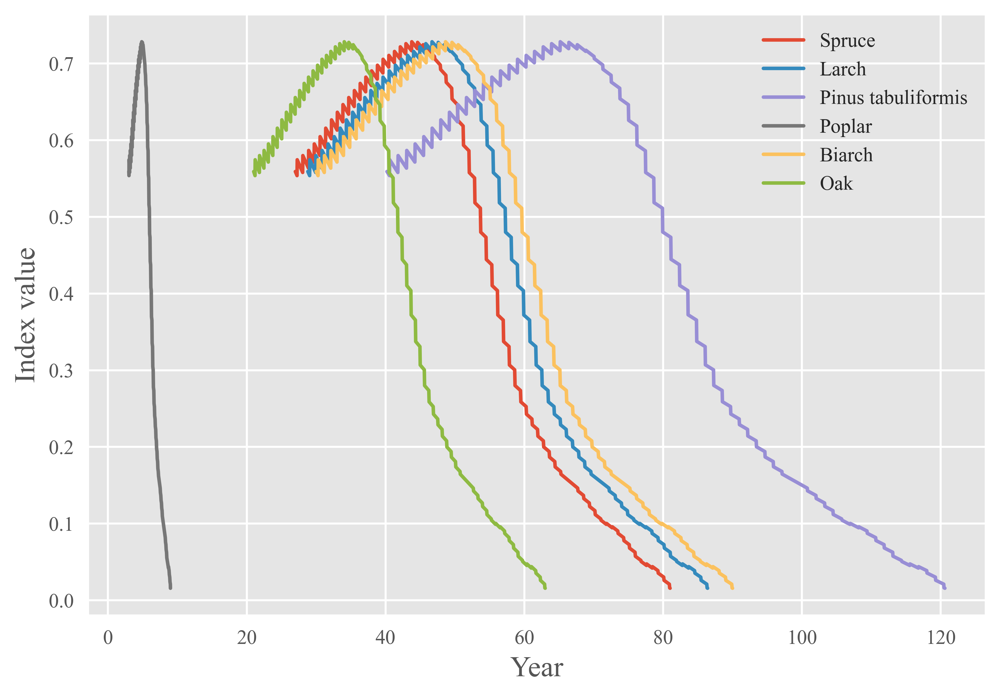

In [804]:
plt.figure(dpi=600)
plt.rc('font',family='Times New Roman',size=12)
df_final1['AHP'].plot()
df_final2['AHP'].plot()
df_final3['AHP'].plot()
df_final4['AHP'].plot()
df_final5['AHP'].plot()
df_final6['AHP'].plot()
plt.legend(['Spruce','Larch','Pinus tabuliformis','Poplar','Biarch','Oak'])
plt.xlabel('Year')
plt.ylabel('Index value')
plt.savefig('C:/Users/Bingbing/Desktop/考虑经济价值.jpg')

In [805]:
df_final1.to_csv('yunshan2.csv')
df_final2.to_csv('luoyesong2.csv')
df_final3.to_csv('yousong2.csv')
df_final4.to_csv('yangshulin2.csv')
df_final5.to_csv('huashu2.csv')
df_final6.to_csv('xiangshu2.csv')

In [806]:
df_final1.loc[df_final1['AHP']==np.max(df_final1['AHP'])]

,Total amount of carbon sequestered,Economy,Conservation of water,Conservation of soil,AHP
43.775388,5.070800e+11,1.838341e+06,38492.878209,41061.922319,0.728205


In [807]:
df_final2.loc[df_final2['AHP']==np.max(df_final2['AHP'])]

,Total amount of carbon sequestered,Economy,Conservation of water,Conservation of soil,AHP
46.693747,9.079368e+09,2151.51362,538.900295,574.866912,0.728205


In [808]:
df_final3.loc[df_final3['AHP']==np.max(df_final3['AHP'])]

,Total amount of carbon sequestered,Economy,Conservation of water,Conservation of soil,AHP
65.176688,8.962882e+09,1541.382892,538.900295,574.866912,0.728205


In [809]:
df_final4.loc[df_final4['AHP']==np.max(df_final4['AHP'])]

,Total amount of carbon sequestered,Economy,Conservation of water,Conservation of soil,AHP
4.863932,1.141633e+12,3.416484e+06,88343.419777,94239.52713,0.728205


In [810]:
df_final5.loc[df_final5['AHP']==np.max(df_final5['AHP'])]

,Total amount of carbon sequestered,Economy,Conservation of water,Conservation of soil,AHP
48.63932,2.781738e+12,604574.039392,135159.816827,144180.4863,0.728205


In [811]:
df_final6.loc[df_final6['AHP']==np.max(df_final6['AHP'])]

,Total amount of carbon sequestered,Economy,Conservation of water,Conservation of soil,AHP
34.047524,6.921507e+10,18330.553064,3378.316135,3603.787535,0.728205


In [819]:
a,b,c,d,df_final7['AHP']=func(850,0.8776,90,94675.3790)

In [821]:
a,b,c,d,df_final8['AHP']=func(850,0.8776,90,94675.3790)

In [827]:
a,b,c,d,df_final9['AHP']=func(850,0.8776,90,94675.3790)

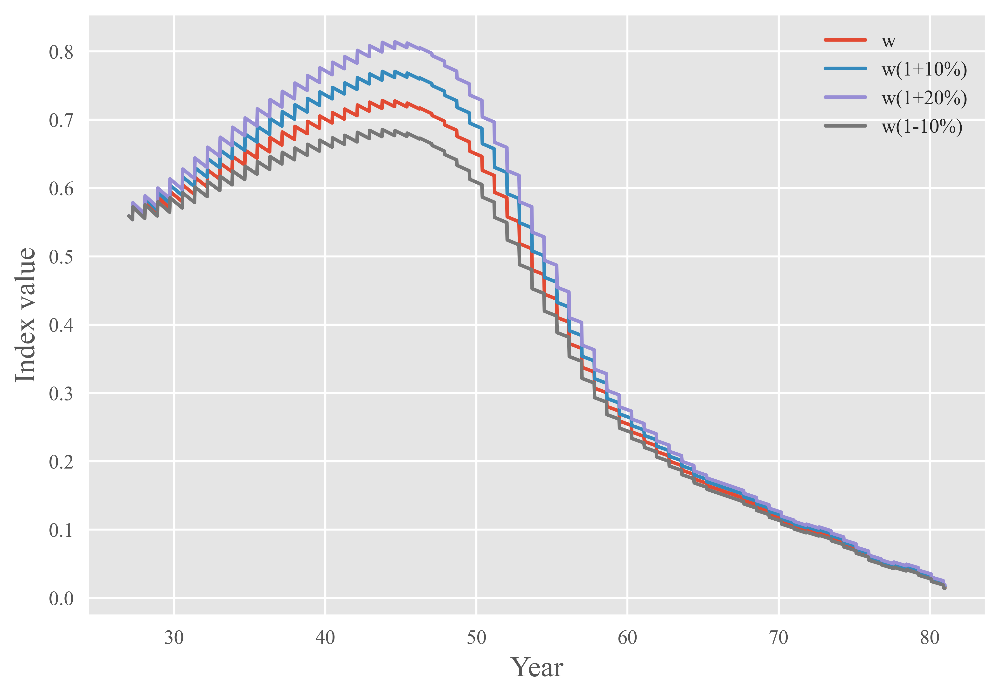

In [830]:
plt.figure(dpi=600)
df_final7.index=[90*i for i in strength]
df_final8.index=[90*i for i in strength]
df_final9.index=[90*i for i in strength]
df_final1['AHP'].plot()
df_final7['AHP'].plot()
df_final8['AHP'].plot()
df_final9['AHP'].plot()
plt.xlabel('Year')
plt.ylabel('Index value')
plt.legend(['w','w(1+10%)','w(1+20%)','w(1-10%)'])
plt.savefig('C:/Users/Bingbing/Desktop/灵敏度分析.jpg')

In [842]:
#预测100年的森林和森林产品的固碳量
#首先是森林
#首先是考虑110棵树的情况
C_each=[]
min=year_df['yhat'][109]
for i in range(0,100):
    #第i年产生i棵老树
   C=i*min
   sum=0
   for j in range(i,110):
       sum=year_df['yhat'][j]+sum
   C=sum+C
   C_each.append(C)

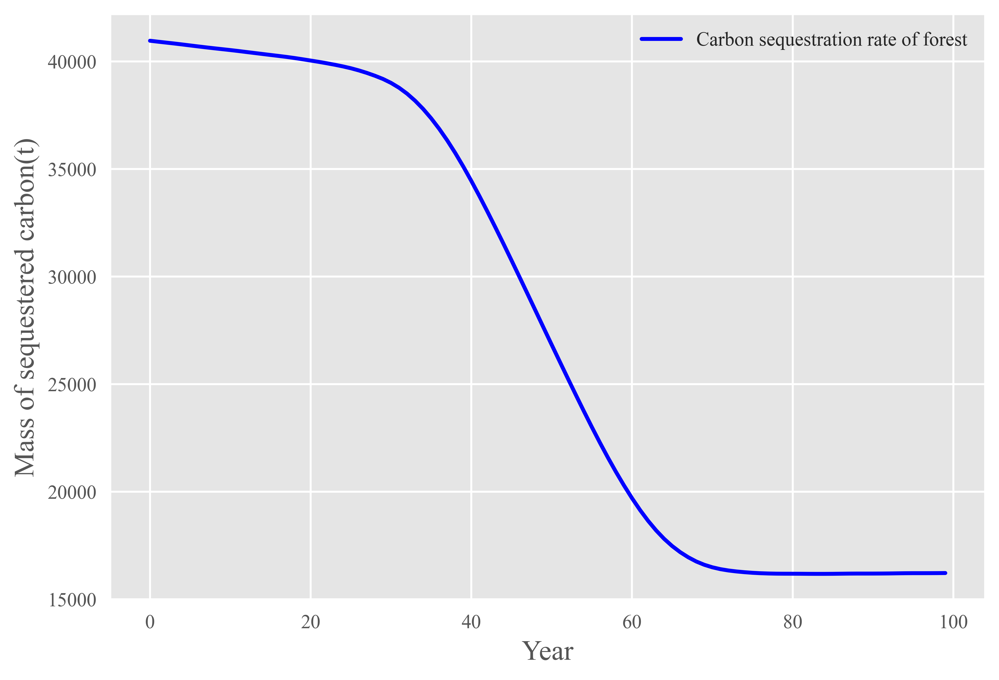

In [868]:
plt.figure(dpi=600)
C_each2=np.array(C_each)*(850*0.8776+11.9*1.1224+11.9*1.1080+1950.8*0.8609+2984*1.3711+74.6*1.3649)*400/110000000
plt.plot(range(len(C_each)),C_each2,c='blue',linewidth=2)
plt.xlabel('Year')
plt.ylabel('Mass of sequestered carbon(t)')
plt.legend(['Carbon sequestration rate of forest'])
plt.savefig('C:/Users/Bingbing/Desktop/森林每年固碳量.jpg')

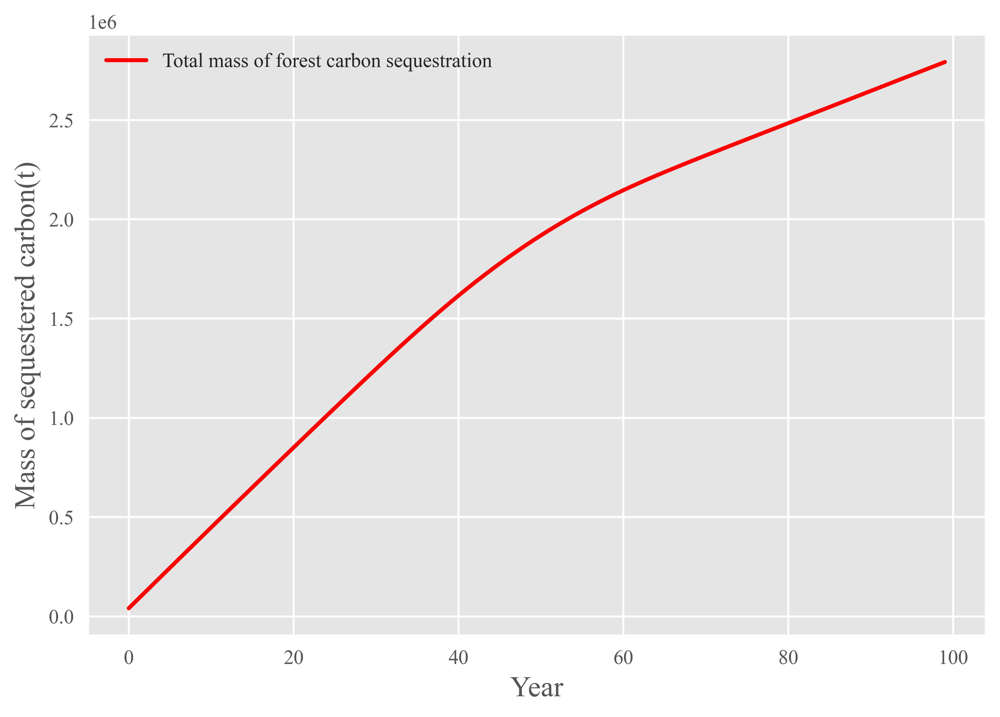

In [869]:
Total=np.cumsum(C_each2)
plt.figure(dpi=600)
plt.plot(range(len(C_each)),Total,linewidth=2,c='red')
#C_each2=np.array(C_each)*(850*0.8776+11.9*1.1224+11.9*1.1080+1950.8*0.8609+2984*1.3711+74.6*1.3649)*400/110000000
#plt.plot(range(len(C_each)),C_each2,c='blue',linewidth=2)
plt.xlabel('Year')
plt.ylabel('Mass of sequestered carbon(t)')
plt.legend(['Total mass of forest carbon sequestration'])
plt.savefig('C:/Users/Bingbing/Desktop/森林总固碳量.jpg')

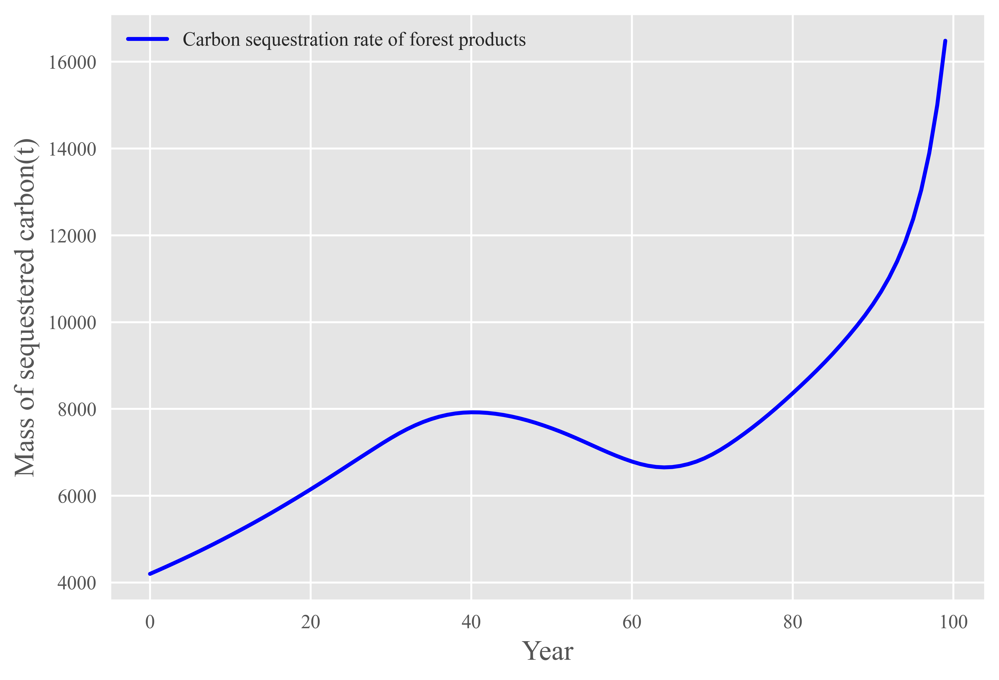

In [870]:
#森林产品
w=0.05
product=[]
for i in range(100):
    each_product=C_each[i]*w*(0.47*0.5*(0.98**(99-i))+0.25*0.5*(0.707**(99-i))+0.28*0.468*(0.98**(99-i)))
    product.append(each_product)
plt.figure(dpi=600)
#C_each2=np.array(C_each)*(850*0.8776+11.9*1.1224+11.9*1.1080+1950.8*0.8609+2984*1.3711+74.6*1.3649)*400/110000000
#plt.plot(range(len(C_each)),C_each2,c='blue',linewidth=2)
plt.plot(range(len(product)),product,c='blue',linewidth=2)
plt.xlabel('Year')
plt.ylabel('Mass of sequestered carbon(t)')
plt.legend(['Carbon sequestration rate of forest products'])
plt.savefig('C:/Users/Bingbing/Desktop/森林产品每年固碳量.jpg')

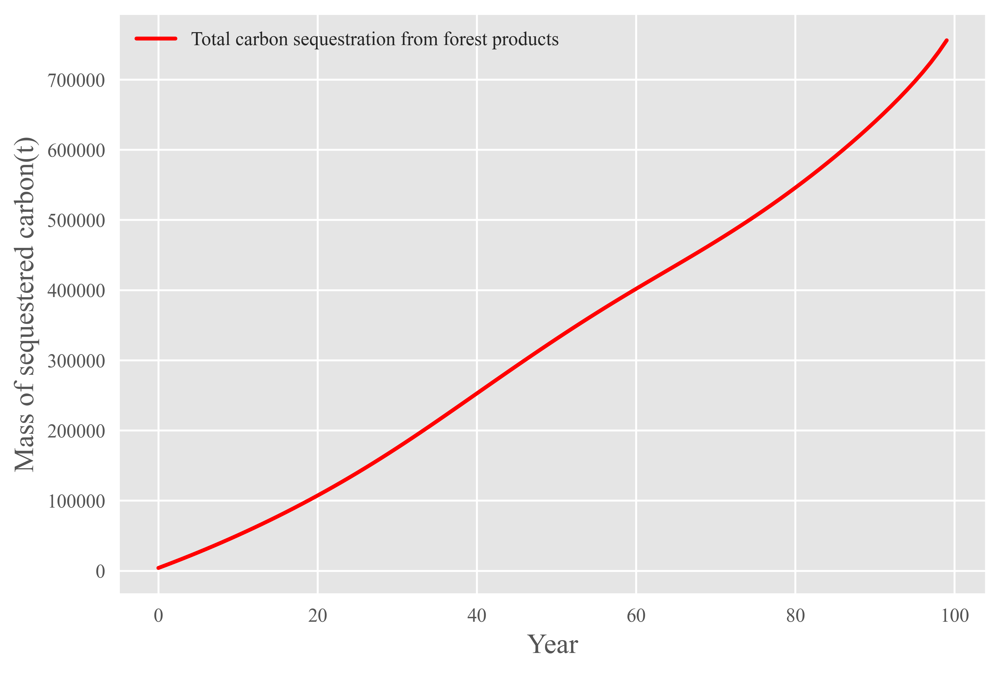

In [871]:
Total_product=np.cumsum(product)

plt.figure(dpi=600)
plt.plot(range(len(C_each)),Total_product,linewidth=2,c='red')
#C_each2=np.array(C_each)*(850*0.8776+11.9*1.1224+11.9*1.1080+1950.8*0.8609+2984*1.3711+74.6*1.3649)*400/110000000
#plt.plot(range(len(C_each)),C_each2,c='blue',linewidth=2)
plt.xlabel('Year')
plt.ylabel('Mass of sequestered carbon(t)')
plt.legend(['Total carbon sequestration from forest products'])
plt.savefig('C:/Users/Bingbing/Desktop/森林产品总固碳量.jpg')    

In [873]:
(Total_product[99]+Total[99])/10000

354.85157409238906